# Image Draw Process



----------
#### Open the *dog_backpack.jpg Make sure to correct for the RGB order.

In [1]:
# Import libraries.
import numpy as np
import matplotlib.pyplot as plt
import cv2

<class 'numpy.ndarray'>
(1401, 934, 3)


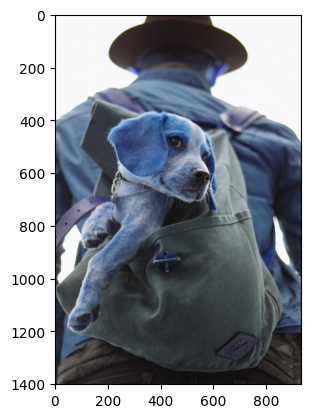

In [3]:
# open image
img = cv2.imread('dog_backpack.jpg')
print(type(img))
print(img.shape)
plt.imshow(img)

(1401, 934, 3)


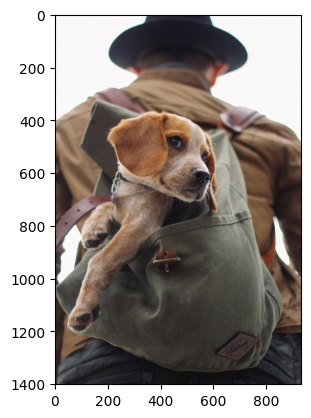

In [4]:
# matplotlib RGB , CV2 BGR, then convert to RGB
img_rgb= cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print(img_rgb.shape)
plt.imshow(img_rgb)

####  Flip the image upside down and display it in the notebook.

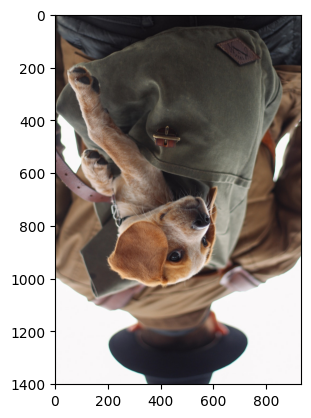

In [5]:
new_img = img_rgb
new_img = cv2.flip(new_img,0)
plt.imshow(new_img)

#### TASK: Draw an empty RED rectangle around the dogs face and display the image in the notebook.

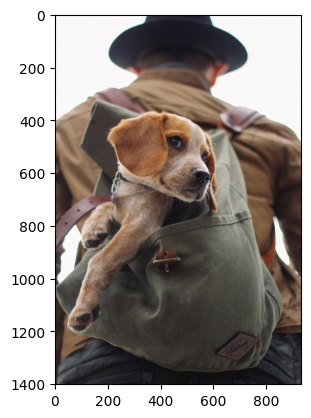

In [6]:
plt.imshow(img_rgb)

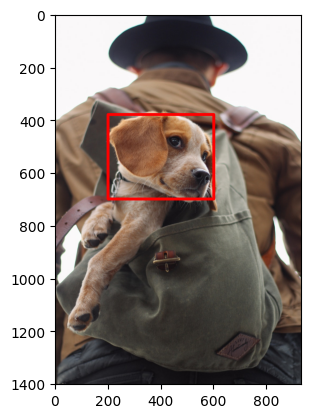

In [6]:
cv2.rectangle(img_rgb,pt1=(200,380),pt2=(600,700),color=(255,0,0),thickness=10)
plt.imshow(img_rgb)

####  Draw a BLUE TRIANGLE in the middle of the image. The size and angle is up to you, but it should be a triangle (three sides) in any orientation.

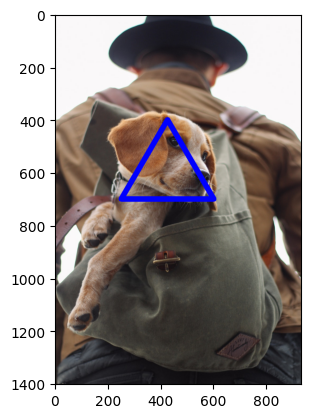

In [7]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
vertices = np.array([[250,700],[425,400],[600,700]],np.int32)
pts = vertices.reshape((-1,1,2))

cv2.polylines(img_rgb,[pts],isClosed=True,color=(0,0,255),thickness=20)
plt.imshow(img_rgb)

###  Can you figure our how to fill in this triangle? It requires a different function that we didn't show in the lecture! See if you can use google search to find it.



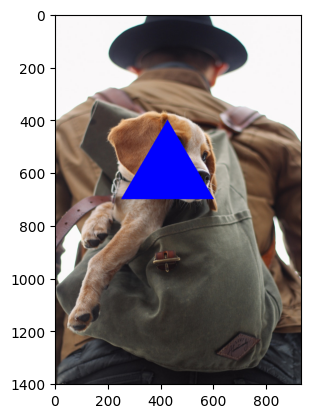

In [8]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
vertices = np.array([[250,700],[425,400],[600,700]],np.int32)
pts = vertices.reshape((-1,1,2))

cv2.fillPoly(img_rgb,[pts],color=(0,0,255))
plt.imshow(img_rgb)

#### TASK: (NOTE: YOU WILL NEED TO RUN THIS AS A SCRIPT). Create a script that opens the picture and allows you to draw empty red circles whever you click the RIGHT MOUSE BUTTON DOWN.

In [ ]:
# Create a function based on a CV2 Event (Left button click)
drawing = False # True if mouse is pressed
ix,iy = -1,-1

# mouse callback function
def draw_rectangle(event,x,y,flags,param):
    global ix,iy,drawing,mode

    if event == cv2.EVENT_LBUTTONDOWN:
        # When you click DOWN with left mouse button drawing is set to True
        drawing = True
        # Then we take note of where that mouse was located
        ix,iy = x,y

    elif event == cv2.EVENT_MOUSEMOVE:
        # Now the mouse is moving
        if drawing == True:
            # If drawing is True, it means you've already clicked on the left mouse button
            # We draw a rectangle from the previous position to the x,y where the mouse is
            #cv2.rectangle(img_rgb,(ix,iy),(x,y),(0,255,0),1)
            pass
           

    elif event == cv2.EVENT_LBUTTONUP:
        # Once you lift the mouse button, drawing is False
        drawing = False
        # we complete the rectangle.
        cv2.rectangle(img_rgb,(ix,iy),(x,y),(0,255,0),2)
        
# Create 
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# This names the window so we can reference it 
cv2.namedWindow(winname='my_drawing')
# Connects the mouse button to our callback function
cv2.setMouseCallback('my_drawing',draw_rectangle)

while True: #Runs forever until we break with Esc key on keyboard
    # Shows the image window
    cv2.imshow('my_drawing',img_rgb)
    # EXPLANATION FOR THIS LINE OF CODE:
    # https://stackoverflow.com/questions/35372700/whats-0xff-for-in-cv2-waitkey1/39201163
    
    # CHECK TO SEE IF ESC WAS PRESSED ON KEYBOARD
    if cv2.waitKey(1) & 0xFF == 27:
        break
# Once script is done, its usually good practice to call this line
# It closes all windows (just in case you have multiple windows called)
cv2.destroyAllWindows()

# blending and pasting images

In [ ]:
img1 = cv2.imread("dog_backpack.png")
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
img2 = cv2.imread("watermark_no_copy.png")
img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)

In [ ]:
plt.imshow(img1)

In [ ]:
plt.imshow(img2)

In [ ]:
print(img1.shape)
print(img2.shape)

In [ ]:
img1= cv2.resize(img1,(1200,1200))
img2= cv2.resize(img2,(1200,1200))

In [ ]:
plt.imshow(img1)

In [ ]:
plt.imshow(img2)

# bending the same size imgaes

In [ ]:
blended = cv2.addWeighted(src1=img1, alpha=0.7, src2=img2, beta=0.5, gamma=0)
plt.imshow(blended)

# small image on top of big image (No bending)

In [ ]:
img1 = cv2.imread("dog_backpack.png")
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
img2 = cv2.imread("watermark_no_copy.png")
img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)

img2= cv2.resize(img2,(600,600))
plt.imshow(img2)

In [ ]:
large_img = img1
small_img = img2
x_offset = 0
y_offset = 0
x_end = x_offset + small_img.shape[1]
y_end = y_offset + small_img.shape[0]
large_img[y_offset:y_end,x_offset:x_end] = small_img

plt.imshow(large_img)

# bending images togather of different sizes

In [ ]:
img1 = cv2.imread("dog_backpack.png")
img1 = cv2.cvtColor(img1,cv2.COLOR_BGR2RGB)
img2 = cv2.imread("watermark_no_copy.png")
img2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)

In [ ]:
img2= cv2.resize(img2,(600,600))
print(img1.shape)
print(img2.shape)

In [ ]:
x_offset = 934 - 600
y_offset = 1401 - 600
rows, cols, channels = img2.shape
roi = img1[y_offset:1401,x_offset:934]
plt.imshow(roi)

In [ ]:
img2gray = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY) 
plt.imshow(img2gray, cmap= 'gray')

In [ ]:
mask_inv =  cv2.bitwise_not(img2gray)
plt.imshow(mask_inv, cmap='gray')

In [ ]:
mask_inv.shape

In [ ]:
white_background = np.full(img2.shape, 255, dtype=np.uint8)
white_background.shape

In [ ]:
# what we did just to convert mask_inv to three channels
bk = cv2.bitwise_or(white_background,white_background, mask= mask_inv)
print(bk.shape)
plt.imshow(bk)

In [ ]:
fk = cv2.bitwise_or(img2,img2, mask= mask_inv)
plt.imshow(fk)

In [ ]:
final_roi = cv2.bitwise_or(roi,fk)
plt.imshow(final_roi)

In [ ]:
larg_img = img1
small_img = final_roi

In [ ]:
larg_img[y_offset:y_offset+small_img.shape[0],x_offset:x_offset+small_img.shape[1]] = small_img
plt.imshow(larg_img)

# Convert 3 channels image to 1 channel

In [ ]:
img3 = cv2.imread('rainbow.jpg',0)

In [ ]:
plt.imshow(img3,cmap='grey')

In [ ]:
img3.max()

In [ ]:

ret,thresh1 = cv2.threshold(img3, 127, 255,cv2.THRESH_BINARY)


In [ ]:
ret

In [ ]:
plt.imshow(thresh1,cmap='grey')

In [ ]:

ret,thresh2 = cv2.threshold(img3, 127, 255,cv2.THRESH_BINARY_INV)
plt.imshow(thresh2,cmap='grey')

In [ ]:
img4 =cv2.imread('crossword.jpg',0)
plt.imshow(img4,cmap='grey')

In [ ]:
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111)
ax.imshow(img4, cmap='gray') 


In [ ]:
def show_img(img):
    fig = plt.figure(figsize=(15, 15))
    ax = fig.add_subplot(111)
    ax.imshow(img, cmap='gray') 


In [ ]:
show_img(img4)

In [ ]:
ret,th1 = cv2.threshold(img4, 180, 255,cv2.THRESH_BINARY)
show_img(th1)

In [ ]:
th2 = cv2.adaptiveThreshold(
    img4,
    255,
    cv2.ADAPTIVE_THRESH_MEAN_C,
    cv2.THRESH_BINARY,
    blockSize=11,  # Example block size
    C=8  # Example constant
)

In [ ]:
show_img(th2)

In [ ]:
blendedd = cv2.addWeighted(src1=th1, alpha=0.6, src2=th2, beta=0.4, gamma=0)
show_img(blendedd)

# functions to load and show image

In [2]:
def load_img(filepath):
    img = cv2.imread(filepath).astype(np.float32)/ 255
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    if img is None:
        raise ValueError("Error loading image. Check the file path.")
    return img

In [3]:
def disply_img(image):
    fig = plt.figure(figsize=(6,5))
    ax  = fig.add_subplot(111)
    ax.imshow(image,cmap='gray')

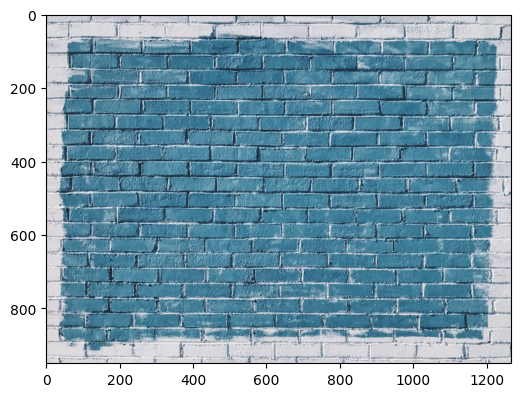

In [4]:
img1 = load_img("bricks.jpg")
disply_img(img1)

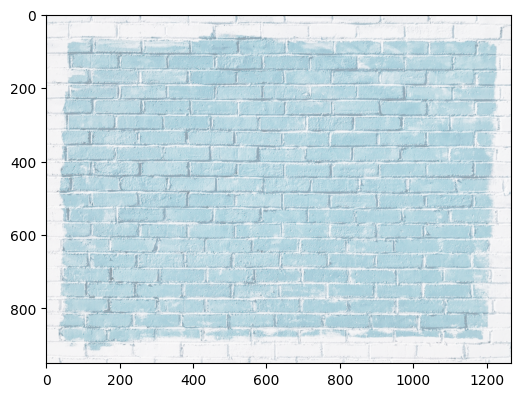

In [5]:
gamma = 1/4
img1_power = np.power(img1,gamma)
disply_img(img1_power)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


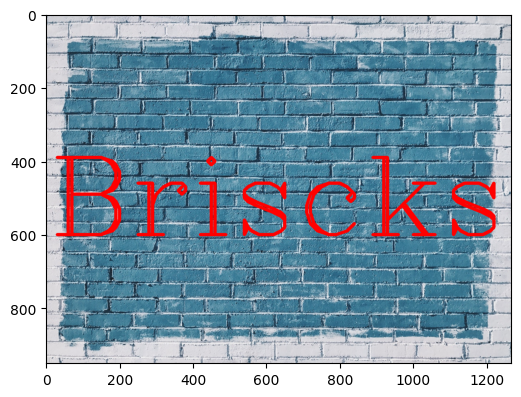

In [6]:
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img1, text="Briscks", org=(10,600), fontFace=font, fontScale=10, color=(255,0,0),thickness=8)
disply_img(img1)

In [7]:
kernal = np.ones(shape=(5,5),dtype=np.float32)/25
kernal

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..254.99995].


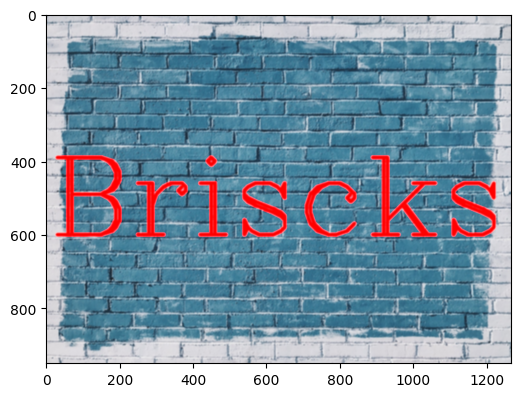

In [8]:
dst = cv2.filter2D(img1,-1,kernal)
disply_img(dst)

In [9]:
img2 = load_img("bricks.jpg")
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img2, text="Briscks", org=(10,600), fontFace=font, fontScale=10, color=(255,0,0),thickness=8)
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


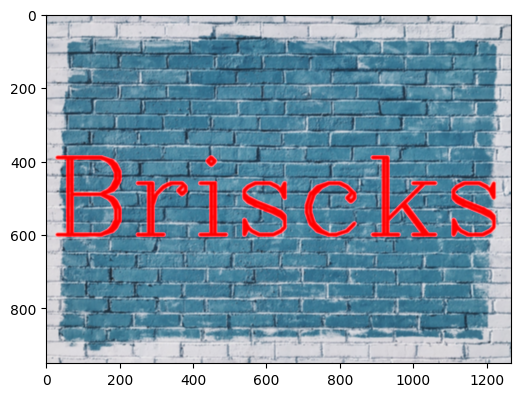

In [10]:
blured = cv2.blur(img2,ksize=(5,5))
disply_img(blured )

In [11]:
img3 = load_img("bricks.jpg")
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img3, text="Briscks", org=(10,600), fontFace=font, fontScale=10, color=(255,0,0),thickness=8)
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


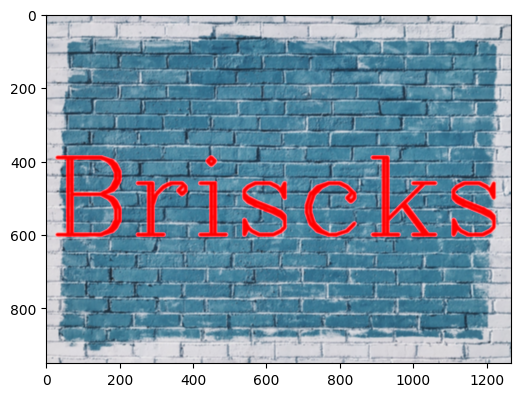

In [12]:
blured_img = cv2.GaussianBlur(img3,(5,5),10)
disply_img(blured_img )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


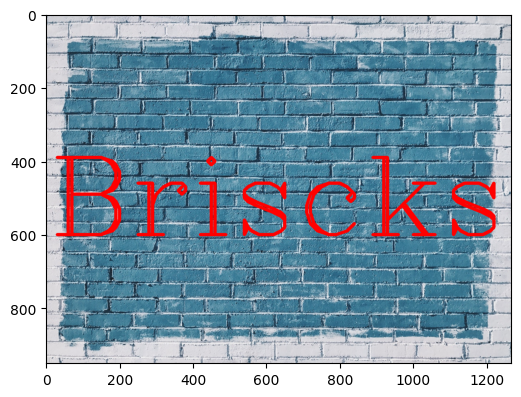

In [13]:
img4 = load_img("bricks.jpg")
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img4, text="Briscks", org=(10,600), fontFace=font, fontScale=10, color=(255,0,0),thickness=8)
disply_img(img4)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


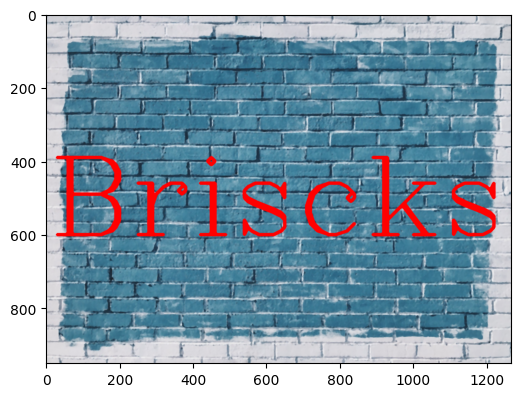

In [14]:
mediam_img = cv2.medianBlur(img4,5)
disply_img(mediam_img)

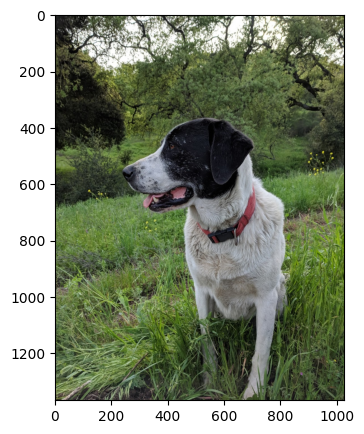

In [15]:
img5 = load_img("sammy.jpg")
disply_img(img5)

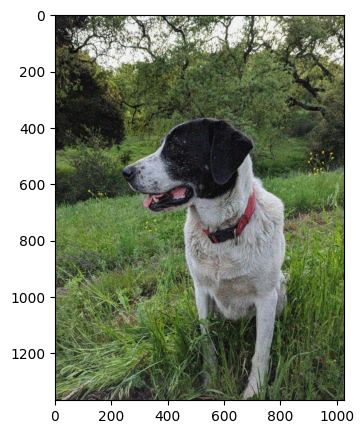

In [16]:
img6 = cv2.imread("sammy_noise.jpg")
disply_img(img6)

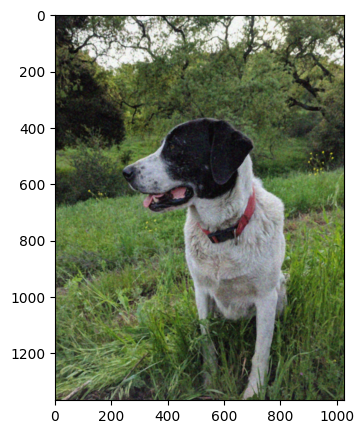

In [17]:
img_noise_removed = cv2.medianBlur(img6,5)
disply_img(img_noise_removed)

In [18]:
img7 = load_img("bricks.jpg")
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img7, text="Briscks", org=(10,600), fontFace=font, fontScale=10, color=(255,0,0),thickness=8)
print('reset')

reset


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


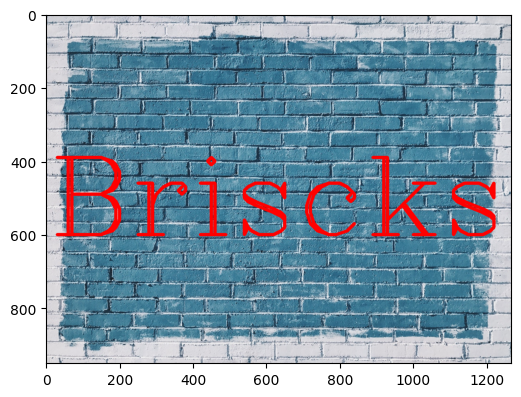

In [19]:
disply_img(img7)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


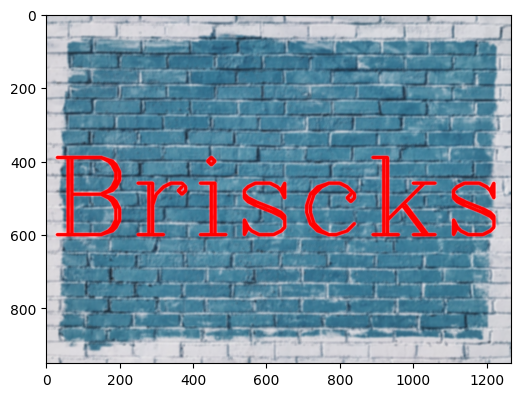

In [20]:
blur = cv2.bilateralFilter(img7,9,75,75)
disply_img(blur)

In [21]:
def load_img():
    black_img = np.zeros((600, 600), dtype=np.uint8)  
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(black_img, text="ABCDE", org=(50, 300), fontFace=font, fontScale=5, color=(255, 255, 255), thickness=10)
    return black_img

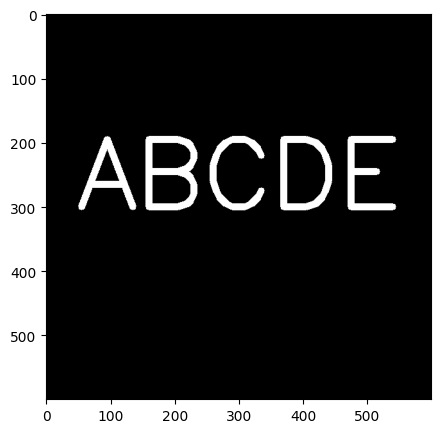

In [22]:
img_black = load_img()
disply_img(img_black)

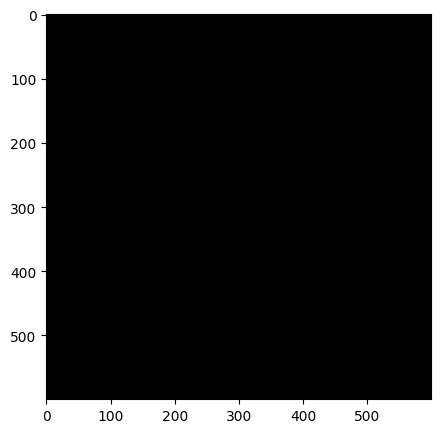

In [23]:
kernal = np.ones((5,5),dtype=np.uint8)
result = cv2.erode(img_black,kernal, iterations =5 )
disply_img(result)

In [24]:
img = load_img()
white_noise = np.random.randint(low=0,high =2, size=(600,600),dtype=np.uint8)
#disply_img(white_noise)

In [25]:
white_noise.max()

1

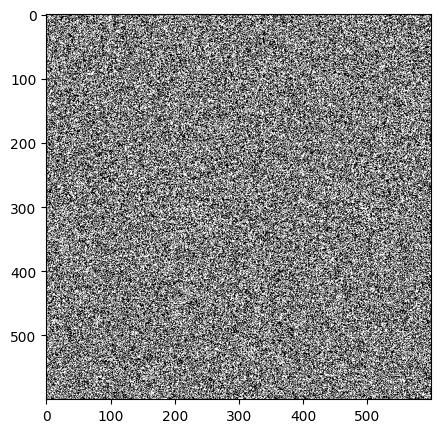

In [26]:
white_noise = white_noise * 255
disply_img(white_noise)

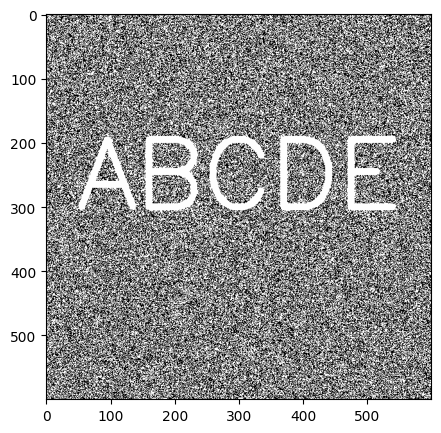

In [27]:
noise_img =  white_noise + img
disply_img(noise_img)

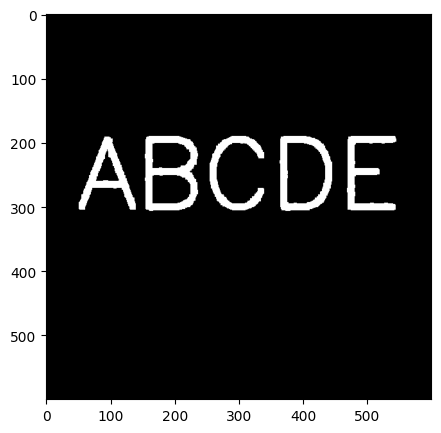

In [28]:
opening = cv2.morphologyEx(noise_img , cv2.MORPH_OPEN,kernal)
disply_img(opening)

In [29]:
img_new = load_img()

In [30]:
black_noise = np.random.randint(low=0,high=2,size=(600,600))

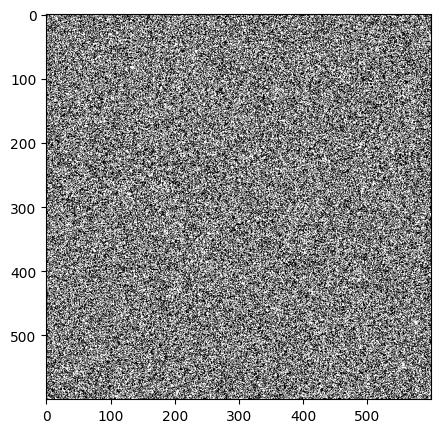

In [31]:
black_noise = black_noise * -255
disply_img(black_noise)

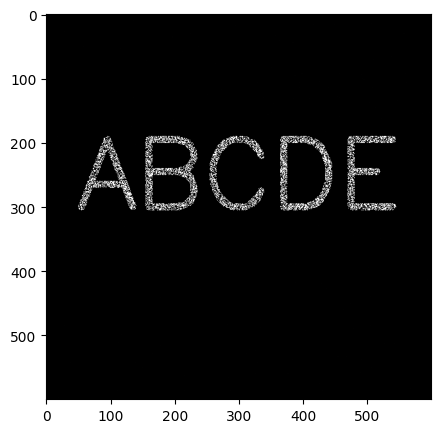

In [32]:
black_noise_img = black_noise + img_new
black_noise_img  = black_noise_img.astype(np.uint8)
disply_img(black_noise_img)

In [33]:
black_noise_img[black_noise_img == -255] = 0

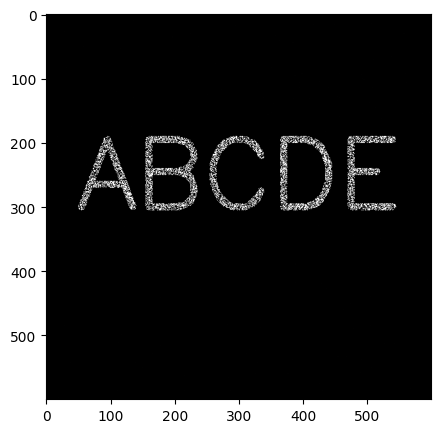

In [34]:
disply_img(black_noise_img)

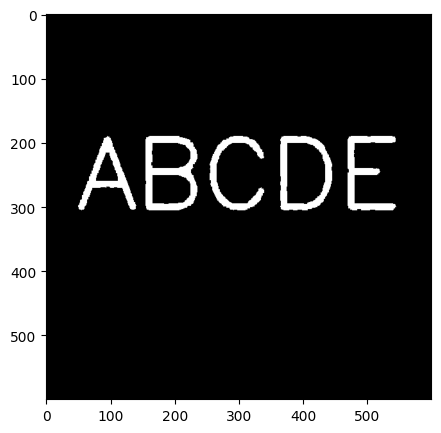

In [35]:
closing = cv2.morphologyEx(black_noise_img, cv2.MORPH_CLOSE, kernal)
disply_img(closing )

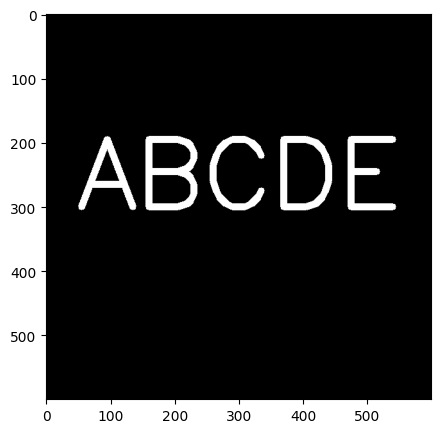

In [36]:
img_2 = load_img()
disply_img(img_2)

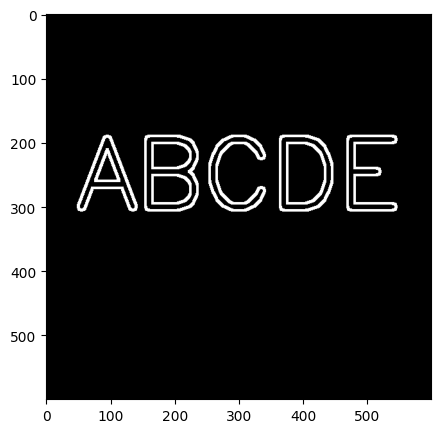

In [37]:
gradient = cv2.morphologyEx(img_2, cv2.MORPH_GRADIENT, kernal)
disply_img(gradient)

# gradient

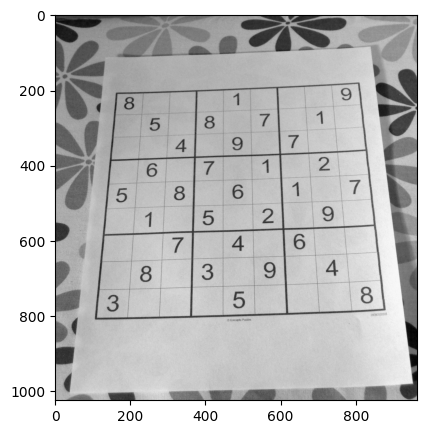

In [38]:
img = cv2.imread("sudoku.jpg",0)
disply_img(img)

In [39]:
sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=5)

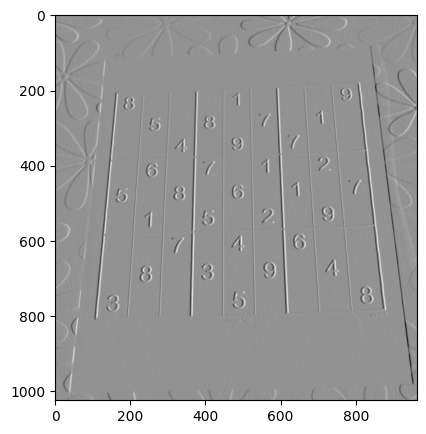

In [40]:
disply_img(sobelx)

In [41]:
sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=5)

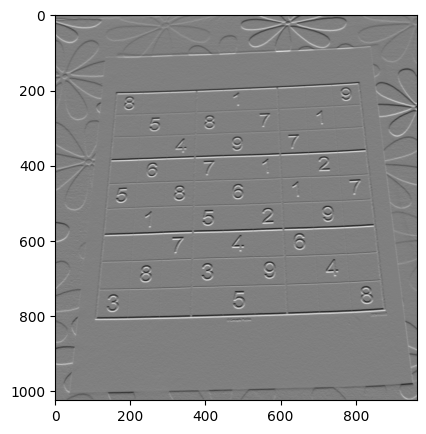

In [42]:
disply_img(sobely)

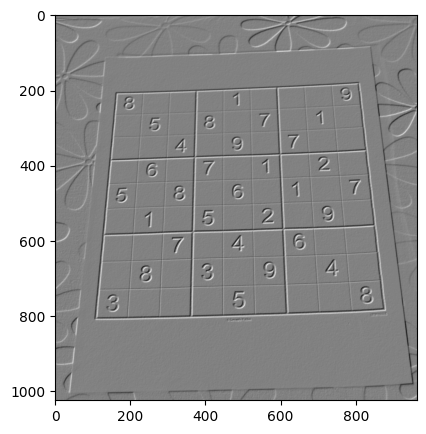

In [43]:
blended = cv2.addWeighted(src1=sobelx,alpha=0.5,src2=sobely, beta=0.5,gamma=0)
disply_img(blended)

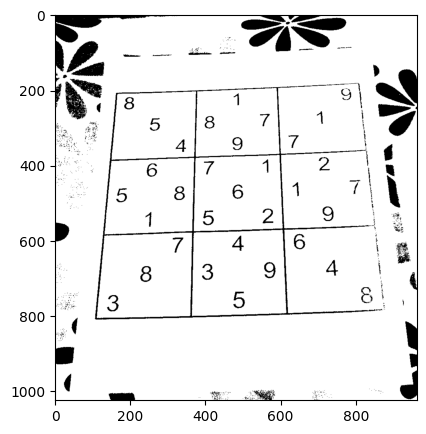

In [44]:
ret1, th1 = cv2.threshold(img,100,255,cv2.THRESH_BINARY)
disply_img(th1)

In [45]:
# Laplician
laplician = cv2.Laplacian(img,cv2.CV_64F)

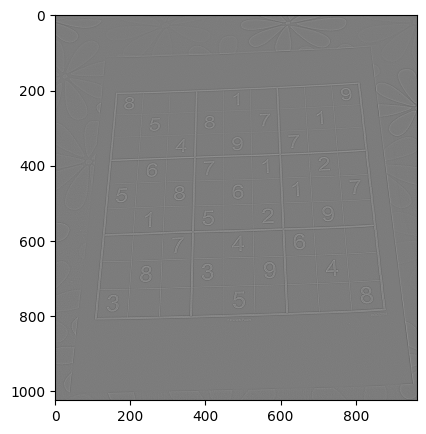

In [46]:
disply_img(laplician)

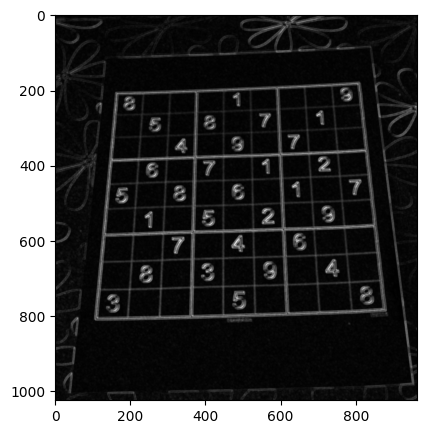

In [47]:
kernal = np.ones((4,4),np.uint8)
gradient = cv2.morphologyEx(blended, cv2.MORPH_GRADIENT, kernal)
disply_img(gradient)

# Histogram

In [48]:
dark_horse = cv2.imread("horse.jpg")
show_horse = cv2.cvtColor(dark_horse,cv2.COLOR_BGR2RGB)

blue_bricks = cv2.imread("bricks.jpg")
show_bricks = cv2.cvtColor(blue_bricks,cv2.COLOR_BGR2RGB)

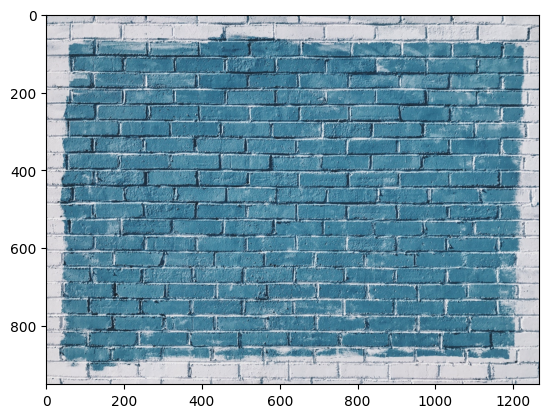

In [49]:
plt.imshow(show_bricks)

In [50]:
Hist_red = cv2.calcHist([show_bricks],channels=[0],mask=None,histSize=[256],ranges=[0,256])

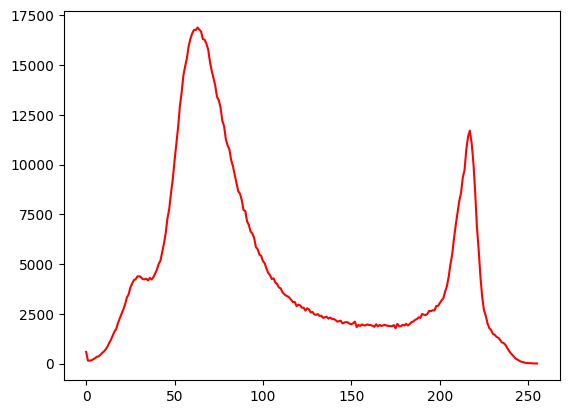

In [51]:
plt.plot(Hist_red,color="red")

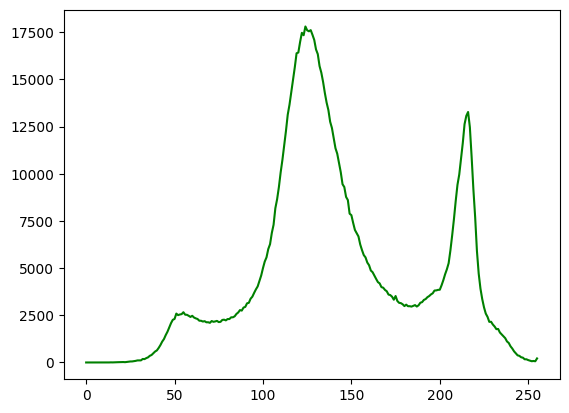

In [52]:
Hist_green = cv2.calcHist([show_bricks],channels=[1],mask=None,histSize=[256],ranges=[0,256])
plt.plot(Hist_green,color="green")

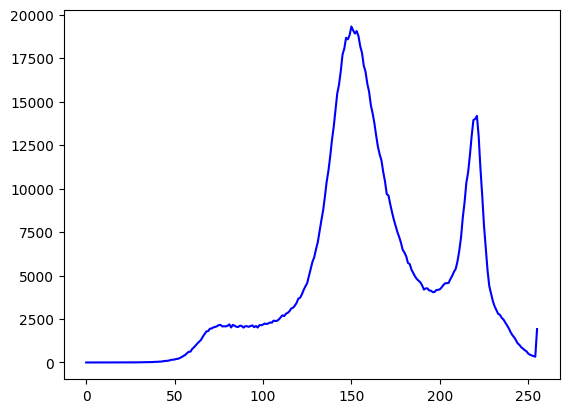

In [53]:
Hist_blue = cv2.calcHist([show_bricks],channels=[2],mask=None,histSize=[256],ranges=[0,256])
plt.plot(Hist_blue,color="blue")

Text(0.5, 1.0, 'Histogram of blur bricks channels')

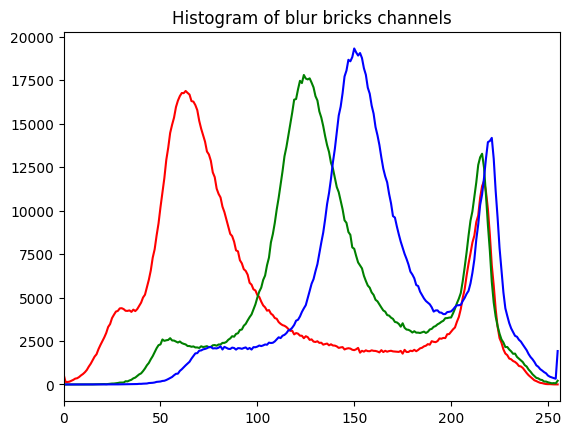

In [54]:
# Histogram for blue bricks three channels
colors = ('r','g','b')
for i, col in enumerate(colors):
    Histr = cv2.calcHist([show_bricks],channels=[i],mask=None,histSize=[256],ranges=[0,256])
    plt.plot(Histr,color=col)
    plt.xlim([0,256])

plt.title("Histogram of blur bricks channels")

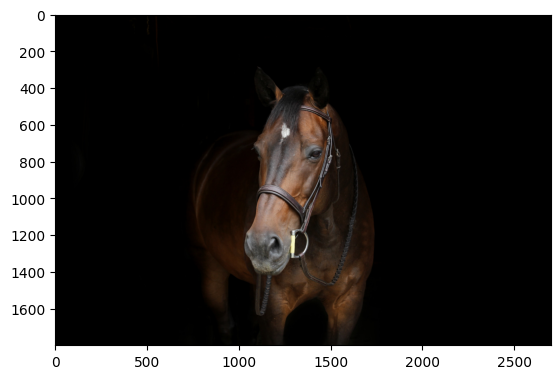

In [55]:
# horse image
plt.imshow(show_horse)

Text(0.5, 1.0, 'Histogram of blur bricks channels')

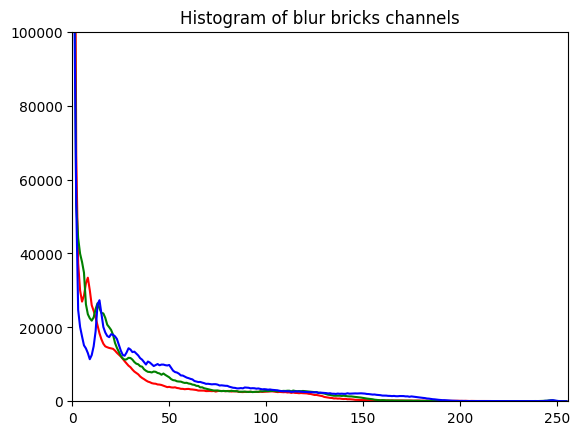

In [56]:
# Histogram for blue bricks three channels
colors = ('r','g','b')
for i, col in enumerate(colors):
    Histr = cv2.calcHist([dark_horse],channels=[i],mask=None,histSize=[256],ranges=[0,256])
    plt.plot(Histr,color=col)
    plt.xlim([0,256])
    plt.ylim([0,100000])

plt.title("Histogram of blur bricks channels")

In [57]:
rainbow = cv2.imread("rainbow.jpg")
show_rainbow = cv2.cvtColor(rainbow ,cv2.COLOR_BGR2RGB)
rainbow.shape

(550, 413, 3)

In [58]:
mask = np.zeros(rainbow.shape[:2],np.uint8)
mask[300:400,100:400] = 255

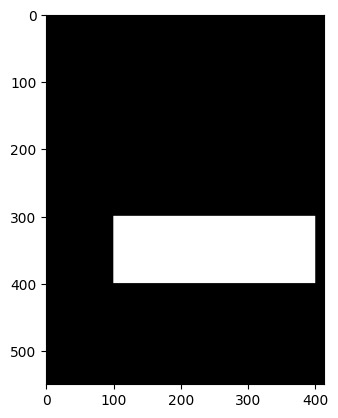

In [59]:
plt.imshow(mask,cmap="grey")

In [60]:
masked_img = cv2.bitwise_and(rainbow,rainbow , mask=mask) # this is for histogram
show_masked_img = cv2.bitwise_and(show_rainbow,show_rainbow , mask=mask) # this for RGB visulisation

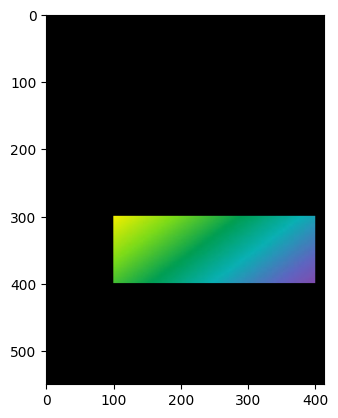

In [61]:
plt.imshow(show_masked_img)

In [62]:
hist_mask_values_red = cv2.calcHist([rainbow],channels=[2],mask=mask,histSize=[256],ranges=[0,256])
hist_values_red = cv2.calcHist([rainbow],channels=[2],mask=None,histSize=[256],ranges=[0,256])

Text(0.5, 1.0, 'Histogram masked red values')

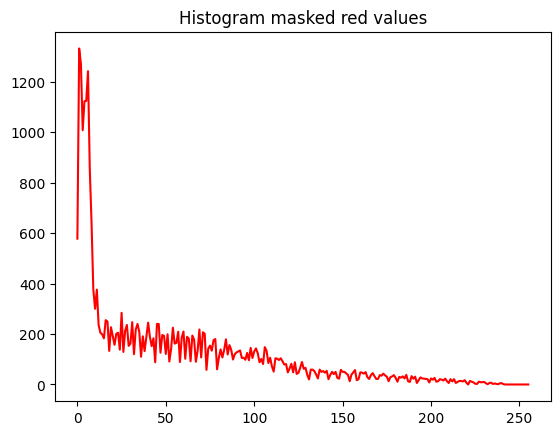

In [63]:
plt.plot(hist_mask_values_red, color="red")
plt.title("Histogram masked red values")

Text(0.5, 1.0, 'Histogram normal red values')

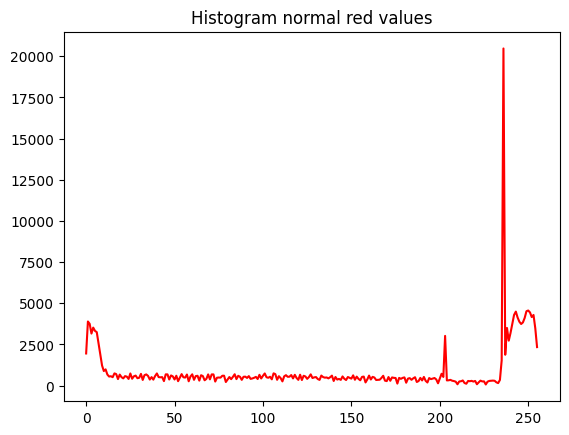

In [64]:
plt.plot(hist_values_red, color="red")
plt.title("Histogram normal red values")

In [65]:
gorilla = cv2.imread("gorilla.jpg",0)

(1295, 1955)

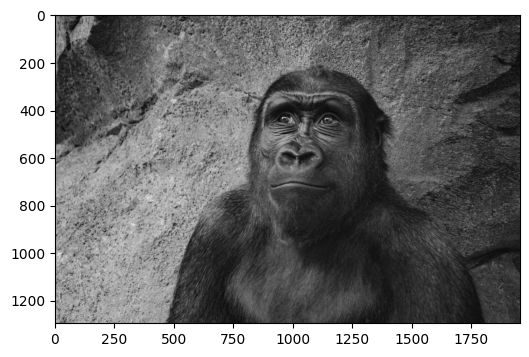

In [66]:
disply_img(gorilla)
gorilla.shape

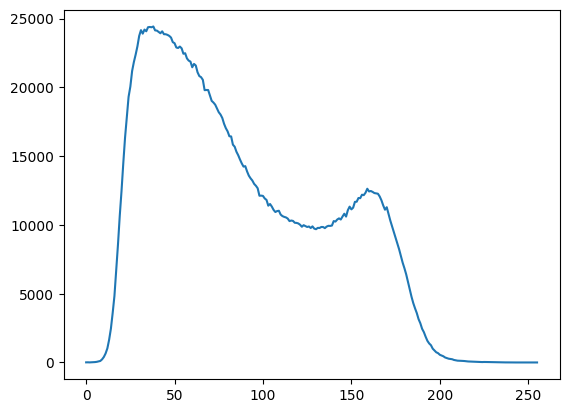

In [67]:
hist_value = cv2.calcHist([gorilla],channels=[0],mask=None,histSize=[256],ranges=[0,256])
plt.plot(hist_value)

In [68]:
eq_gorila = cv2.equalizeHist(gorilla)

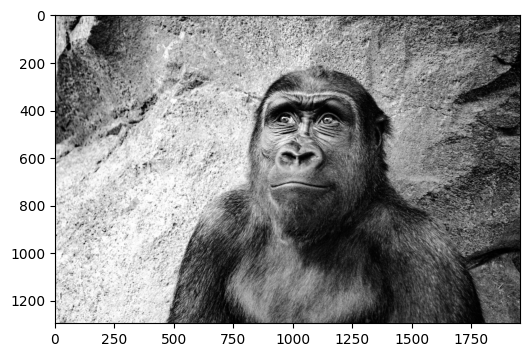

In [69]:
disply_img(eq_gorila)

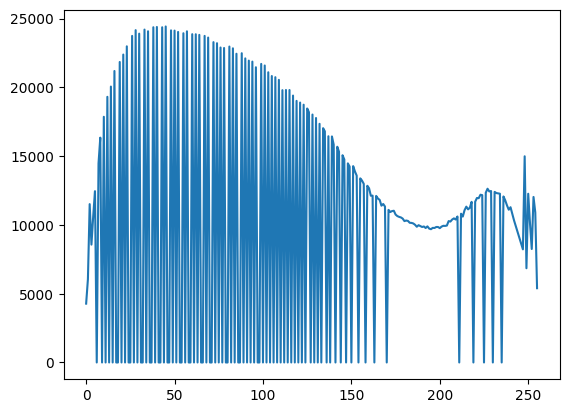

In [70]:
eq_hist_value = cv2.calcHist([eq_gorila],channels=[0],mask=None,histSize=[256],ranges=[0,256])
plt.plot(eq_hist_value)

In [71]:
color_gorila = cv2.imread("gorilla.jpg")
show_color_gorila = cv2.cvtColor(color_gorila,cv2.COLOR_BGR2RGB)

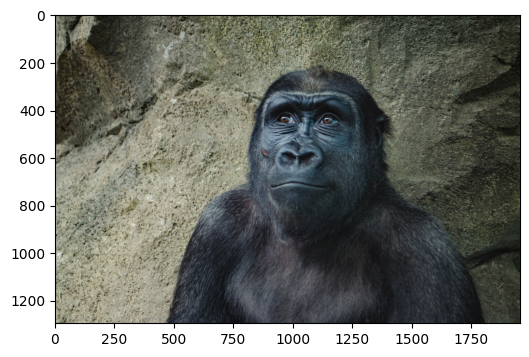

In [72]:
disply_img(show_color_gorila)

In [73]:
hsv_gorila = cv2.cvtColor(color_gorila,cv2.COLOR_BGR2HSV)

In [74]:
hsv_gorila[:,:,2] =  cv2.equalizeHist(hsv_gorila[:,:,2])

In [75]:
hsv_gorila_rgb = cv2.cvtColor(hsv_gorila,cv2.COLOR_HSV2RGB)

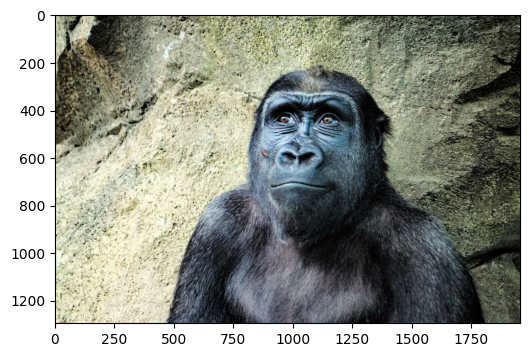

In [76]:
disply_img(hsv_gorila_rgb)